In [1]:
import cv2
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from collections import Counter
import tensorflow as tf
from tensorflow import keras

import sys
from pathlib import Path
current_script_path = Path().resolve()

functions_dir = current_script_path.parents[0] / 'Functions'
sys.path.insert(0, str(functions_dir))
print(functions_dir)
import mouse as mouse

ssm_dir = current_script_path.parents[1] / 'SSM'
sys.path.insert(0, str(ssm_dir))
print(ssm_dir)
import ssm as ssm
from ssm.plots import gradient_cmap

aeon_mecha_dir = current_script_path.parents[1] / 'aeon_mecha' 
sys.path.insert(0, str(aeon_mecha_dir))
print(aeon_mecha_dir)
import aeon
import aeon.io.api as api
from aeon.io import reader, video
from aeon.schema.schemas import social02
from aeon.schema.dataset import exp02
from aeon.schema.schemas import social02
from aeon.analysis.utils import visits, distancetravelled

LABELS = [
    ['AEON3', 'Pre','BAA-1104045'],
    ['AEON3', 'Pre','BAA-1104047'],
    ['AEON3', 'Post','BAA-1104045'],
    ['AEON3', 'Post','BAA-1104047'],
    ['AEON4', 'Pre','BAA-1104048'], 
    ['AEON4', 'Pre','BAA-1104049'],
    ['AEON4', 'Post','BAA-1104048'],
    ['AEON4', 'Post','BAA-1104049']
]
nodes_name = ['nose', 'head', 'right_ear', 'left_ear', 'spine1', 'spine2','spine3', 'spine4']
color_names = [
    'black', 'blue', 'red', 'tan', 'green', 'brown', 
    'purple', 'orange', 'magenta', 'olive', 'pink', 
    'darkblue', 'lime', 'cyan', 'magenta', 'gold', 
    'navy', 'maroon', 'teal', 'grey'
]

2024-08-07 12:01:07.403837: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /nfs/nhome/live/zimol/.local/lib/python3.9/site-packages/cv2/../../lib64:
2024-08-07 12:01:07.403927: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


/nfs/nhome/live/zimol/ProjectAeon/Code/Functions
/nfs/nhome/live/zimol/ProjectAeon/SSM
/nfs/nhome/live/zimol/ProjectAeon/aeon_mecha


# **0. Get Data for the Single-Mouse Experiment**

In [2]:
Mouse = mouse.Mouse(aeon_exp = 'AEON3', type = 'Pre', mouse = 'BAA-1104045')
color_names = [
    'black', 'blue', 'red', 'tan', 'green', 'brown', 
    'purple', 'orange', 'magenta', 'olive', 'pink', 
    'darkblue', 'lime', 'cyan', 'magenta', 'gold', 
    'navy', 'maroon', 'teal', 'grey'
]

## ***I. Information***

In [6]:
print(Mouse.aeon_exp, Mouse.type, Mouse.mouse)
print(Mouse.root)

AEON3 Pre BAA-1104045
/ceph/aeon/aeon/data/raw/AEON3/social0.2/


## ***II. Body Labels Position from SLEAP***

In [4]:
display(Mouse.body_data_x.head())
display(Mouse.body_data_y.head())

,nose,head,right_ear,left_ear,spine1,spine2,spine3,spine4
2024-01-31 10:21:35.080,1203.201782,1203.925171,1209.064209,1201.788208,1207.383911,1211.280273,1213.783813,1217.407349
2024-01-31 10:21:35.180,1205.461060,1205.512695,1209.911621,1202.773193,1207.588257,1211.282593,1213.485962,1217.175415
2024-01-31 10:21:35.280,1207.371704,1207.467773,1211.683105,1203.540161,1208.915527,1211.249390,1212.134766,1215.658691
2024-01-31 10:21:35.380,1207.028564,1207.383179,1211.870361,1203.626221,1209.086182,1211.348389,1213.243530,1215.575195
2024-01-31 10:21:35.480,1205.055786,1207.040649,1211.657593,1204.013794,1209.815186,1213.197021,1213.707642,1215.047485


,nose,head,right_ear,left_ear,spine1,spine2,spine3,spine4
2024-01-31 10:21:35.080,517.553955,523.399963,525.293457,528.802612,530.699463,536.604614,543.443665,550.381470
2024-01-31 10:21:35.180,517.062500,523.073792,525.420776,528.744019,530.694580,536.633789,543.415222,549.415161
2024-01-31 10:21:35.280,516.813416,523.322693,526.870117,528.614746,531.385315,538.595581,545.203308,550.440552
2024-01-31 10:21:35.380,516.114075,522.494812,525.199402,526.960327,529.357117,536.458435,543.423157,550.268066
2024-01-31 10:21:35.480,516.022339,522.266052,524.340881,527.015442,529.103271,536.199951,542.950806,550.003784


## ***III. Centroid Position Inferred from LDS***

In [5]:
display(Mouse.mouse_pos.head())

,x,y,smoothed_position_x,smoothed_position_y,smoothed_speed,smoothed_acceleration
2024-01-31 10:21:35.080,1211.280273,536.604614,1208.792563,535.186117,4.551833,44.713777
2024-01-31 10:21:35.180,1211.282593,536.633789,1209.317782,535.544937,8.171147,36.236906
2024-01-31 10:21:35.280,1211.249390,538.595581,1210.050673,535.997872,9.069689,10.685626
2024-01-31 10:21:35.380,1211.348389,536.458435,1210.793780,536.364330,7.541719,19.167204
2024-01-31 10:21:35.480,1213.197021,536.199951,1211.393213,536.513614,4.992760,33.118302


In [31]:
exp_session = mouse.Session(aeon_exp = Mouse.aeon_exp, type = Mouse.type, mouse = Mouse.mouse, start = Mouse.starts[0], end = Mouse.ends[0])
exp_session.kinematics.Run(Mouse)
mouse_lds_parameters = exp_session.kinematics.parameters
print(mouse_lds_parameters['sigma_a'])
print(mouse_lds_parameters['sigma_x'])
print(mouse_lds_parameters['sigma_y'])
print(mouse_lds_parameters['V0'])

25.049131393432617
-1.0851688466478784
1.1287684076899842
[[2.23350997e+02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 4.24555478e-04 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.76180117e-06 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.38830577e+02
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  1.54839694e-07 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.60675360e-06]]


## ***IV. Foraging Activity Information***

In [3]:
Mouse.Run_Visits()

Get_Visits Completed


### ***0. Nest***

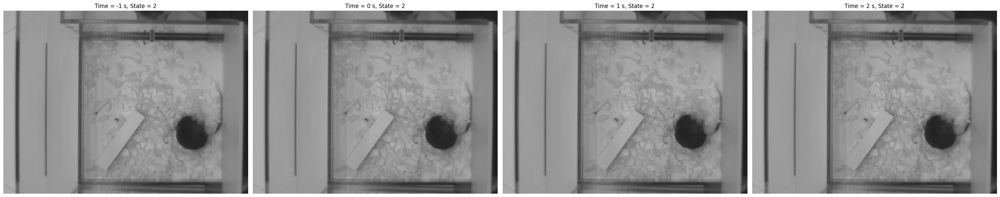

In [75]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, 0, 1, 2]
trigger = Mouse.mouse_pos.index[64130]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraNest.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/Neststate2.png')
plt.show()

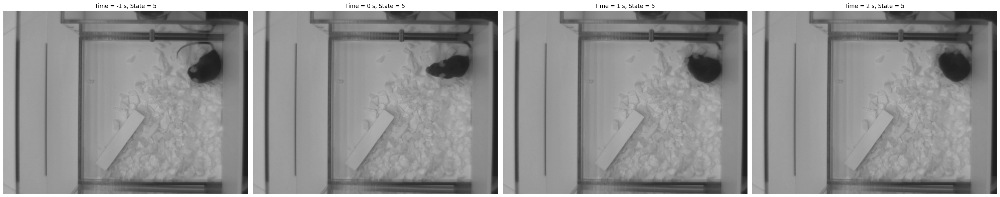

In [72]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, 0, 1, 2]
trigger = Mouse.mouse_pos.index[21427]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraNest.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/Neststate5.png')
plt.show()

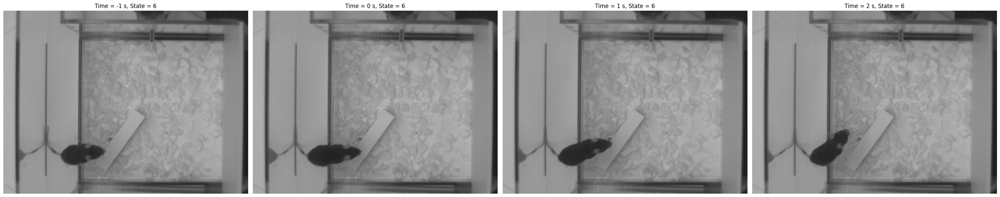

In [87]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, 0, 1, 2]
trigger = Mouse.mouse_pos.index[155497]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraNest.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/Neststate6.png')
plt.show()

### ***i. Enter Arena***

In [8]:
print(Mouse.arena.radius)
print(Mouse.arena.origin)
print(Mouse.arena.patch_location)

496.0
[680, 565]
{'Patch1': array([872.25, 567.  ]), 'Patch2': array([580.75, 738.  ]), 'Patch3': array([579.5 , 398.75])}


In [9]:
display(Mouse.arena.entry)

DatetimeIndex(['2024-01-31 10:22:18.480000', '2024-01-31 10:23:02.180000',
               '2024-01-31 10:24:52.480000', '2024-01-31 10:28:32.880000',
               '2024-01-31 10:30:08.980000', '2024-01-31 10:33:27.380000',
               '2024-01-31 10:35:30.480000', '2024-01-31 10:38:26.280000',
               '2024-01-31 10:41:06.080000', '2024-01-31 10:48:37.980000',
               ...
               '2024-02-03 15:44:23.780000', '2024-02-03 15:49:04.380000',
               '2024-02-03 15:50:08.780000', '2024-02-03 15:58:45.980000',
               '2024-02-03 15:59:25.580000', '2024-02-03 15:59:46.080000',
               '2024-02-03 16:20:17.980000', '2024-02-03 16:25:02.480000',
               '2024-02-03 16:25:44.680000', '2024-02-03 16:32:11.680000'],
              dtype='datetime64[ns]', length=489, freq=None)

### ***ii. Visits in Patch***

In [12]:
display(Mouse.arena.visits.head())

,start,end,duration,speed,acceleration,entry,patch,pellet,last_pellets_self,last_pellets_other,last_interval,next_interval,last_duration,last_pellets_interval
0,2024-01-31 12:48:50.868000031,2024-01-31 12:49:26.480,35.579999,44.578574,90.474067,73.388000,Patch2,0.0,0,0,0.000000,502.348000,0.000000,0.000000
1,2024-01-31 12:57:48.828000069,2024-01-31 12:59:05.080,68.039999,44.340917,89.878210,71.448000,Patch3,0.0,0,0,502.348000,139.045984,35.579999,537.927999
2,2024-01-31 13:01:24.125984192,2024-01-31 13:04:13.480,167.390015,60.071368,154.646224,286.745984,Patch1,1.0,0,0,139.045984,70.156000,68.039999,745.013982
3,2024-01-31 13:05:23.636000156,2024-01-31 13:08:24.780,179.849983,68.065152,136.252153,526.256000,Patch3,2.0,0,1,70.156000,133.945984,167.390015,70.156000
4,2024-01-31 13:10:38.725984097,2024-01-31 13:11:09.080,27.350016,57.164172,124.407624,18.045984,Patch1,0.0,1,2,133.945984,72.255999,179.849983,133.945984


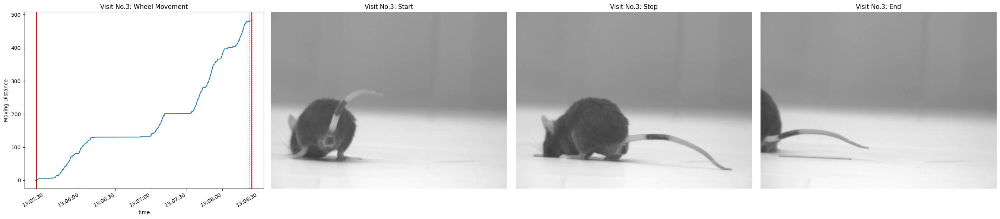

In [28]:
exp_visit = 3
fig, axs = plt.subplots(1,4,figsize = (27, 6))

# Wheel movement during visit
encoder = Mouse.arena.Move_Wheel(start = Mouse.arena.visits['start'][exp_visit]- pd.Timedelta('2S'), end = Mouse.arena.visits['end'][exp_visit] + pd.Timedelta('1S'), patch = Mouse.arena.visits['patch'][exp_visit])
encoder = encoder[:Mouse.arena.visits['end'][exp_visit] + pd.Timedelta('1S')]

groups = encoder['Move'].ne(encoder['Move'].shift()).cumsum()
moves = encoder[encoder['Move'] == 1].groupby(groups)['Move']
for name, group in moves:
    stop_wheel = group.index[-1]

encoder.Distance.plot(ax = axs[0])
axs[0].set_ylabel('Moving Distance')
axs[0].axvline(x = Mouse.arena.visits['start'][exp_visit], color = 'red')
axs[0].axvline(x = Mouse.arena.visits['end'][exp_visit], color = 'red')
axs[0].axvline(x = stop_wheel, color = 'red', linestyle = ':')
axs[0].set_title('Visit No.' + str(exp_visit) + ': Wheel Movement')

# Start: start moving the wheel
time = Mouse.arena.visits['start'][exp_visit]
start, end = time, time + pd.Timedelta("0.3S")
root = Mouse.root
video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
#cv2.imwrite("../Images/Social_BodyInfo/" + variable + '/frames/' + Mouse_title + '_' + value_str + '.jpg', first_frame)

rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[1].imshow(rgb_frame)
axs[1].set_title('Visit No.' + str(exp_visit) + ': Start')
axs[1].axis('off')  # Hide axes

# Stop: stop moving the wheel
time = stop_wheel
start, end = time, time + pd.Timedelta("0.3S")
root = Mouse.root
video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
#cv2.imwrite("../Images/Social_BodyInfo/" + variable + '/frames/' + Mouse_title + '_' + value_str + '.jpg', first_frame)

rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[2].imshow(rgb_frame)
axs[2].set_title('Visit No.' + str(exp_visit) + ': Stop')
axs[2].axis('off')  # Hide axes

# End: Leave wheel area
time = Mouse.arena.visits['end'][exp_visit]
start, end = time, time + pd.Timedelta("0.3S")
root = Mouse.root
video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
#cv2.imwrite("../Images/Social_BodyInfo/" + variable + '/frames/' + Mouse_title + '_' + value_str + '.jpg', first_frame)

rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[3].imshow(rgb_frame)
axs[3].set_title('Visit No.' + str(exp_visit) + ': End')
axs[3].axis('off')  # Hide axes

plt.tight_layout()
plt.savefig('../Images/Introduction/Visit.png')
plt.show()

In [80]:
times = [-1, 0, 1, 2]
for j in range(10000, 1000000,1):
    trigger = Mouse.mouse_pos.index[j]
    S = []
    for i in range(len(times)):
        time = trigger + pd.Timedelta(str(times[i]) + "S")
        start, end = time, time + pd.Timedelta("1S")
        state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
        S.append(state)
    if S[0] == 5 and S[1] == 5 and S[2] == 5 and S[3] == 5 and Mouse.mouse_pos['r'][j] < Mouse.arena.radius:
        print(j)
        break

25938


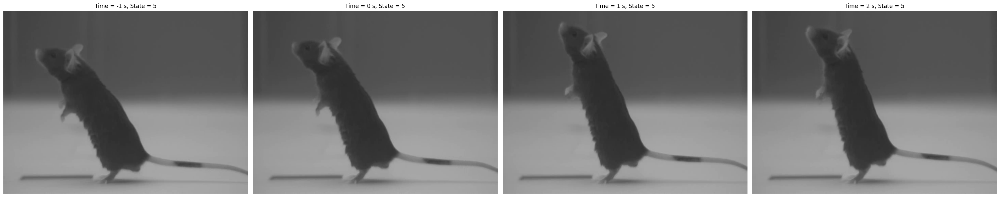

In [83]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, 0, 1, 2]
trigger = Mouse.mouse_pos.index[25938]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraPatch2.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/ArenaState5.png')
plt.show()

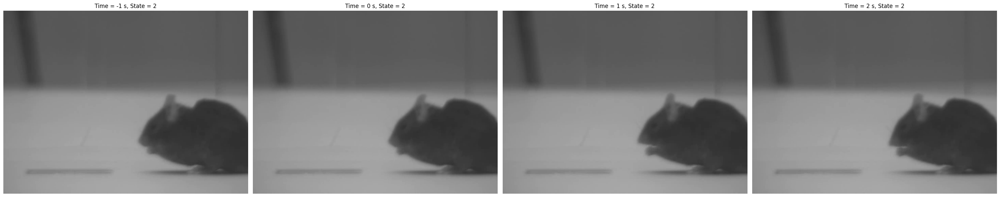

In [79]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, 0, 1, 2]
trigger = Mouse.mouse_pos.index[20660]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/ArenaState2.png')
plt.show()

#### ***Approaching Wheel***

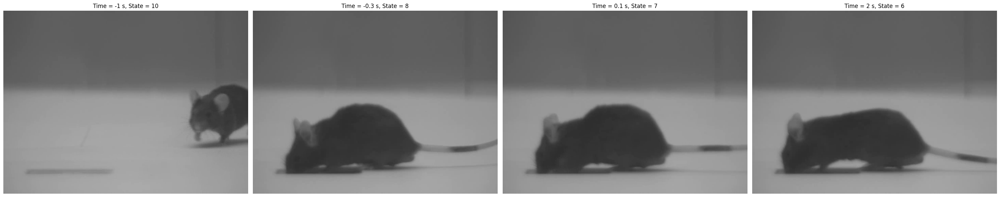

In [41]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [-1, -0.3, 0.1, 2]
trigger = Mouse.arena.visits['start'].to_numpy()[-48]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/ApproachingWheelProcess.png')
plt.show()

#### ***Leaving Wheel***

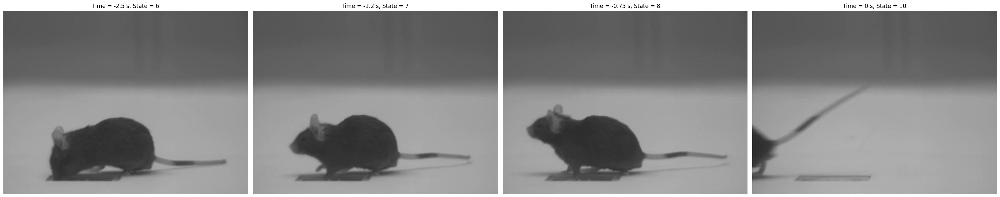

In [51]:
times = [-2.5, -1.2, -0.75, 0]

trigger = Mouse.arena.visits['end'].to_numpy()[-1]
root = Mouse.root

fig, axs = plt.subplots(1,4,figsize = (30, 8))

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraPatch1.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/LeavingWheelProcess.png')
plt.show()

#### ***Entering Arena***

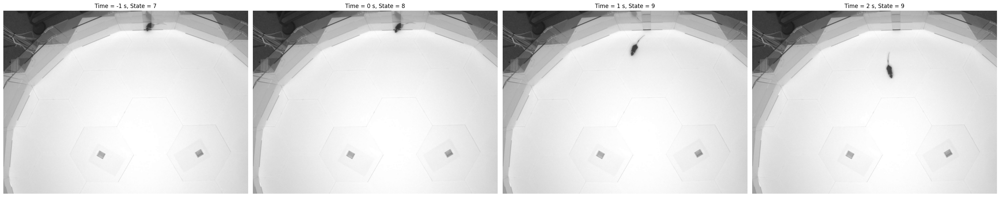

In [58]:
times = [-1, 0, 1, 2]

trigger = Mouse.arena.entry[10]
root = Mouse.root

fig, axs = plt.subplots(1,4,figsize = (30, 8))

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraSouth.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/EnterArenaProcess.png')
plt.show()

### ***iii. Pellet Delivery***

In [12]:
display(Mouse.arena.pellets.head())

,event
time,
2024-01-31 13:01:56.155488014,TriggerPellet
2024-01-31 13:05:24.997504234,TriggerPellet
2024-01-31 13:06:05.353504181,TriggerPellet
2024-01-31 13:27:52.735487938,TriggerPellet
2024-01-31 13:29:24.445504189,TriggerPellet


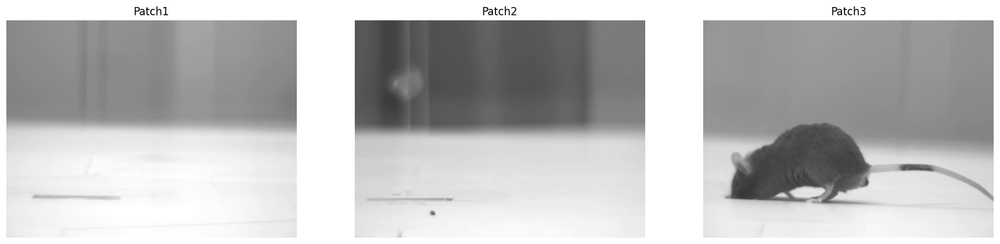

In [29]:
time = Mouse.arena.pellets.index[2]
start, end = time, time + pd.Timedelta("1S")
root = Mouse.root

fig, axs = plt.subplots(1,3,figsize = (20, 6))

video_metadata = aeon.load(root, social02.CameraPatch1.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[0].imshow(rgb_frame)
axs[0].set_title('Patch1')
axs[0].axis('off')

video_metadata = aeon.load(root, social02.CameraPatch2.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[1].imshow(rgb_frame)
axs[1].set_title('Patch2')
axs[1].axis('off')

video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
video_metadata.index = video_metadata.index.round("20L")
frames = video.frames(video_metadata)
first_frame = next(frames)
rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
axs[2].imshow(rgb_frame)
axs[2].set_title('Patch3')
axs[2].axis('off')
plt.tight_layout()
plt.show()

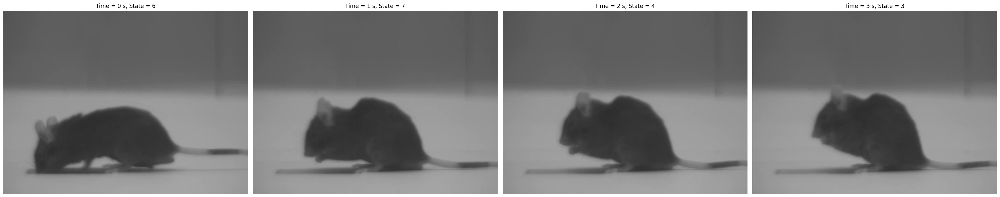

In [26]:
fig, axs = plt.subplots(1,4,figsize = (30, 8))

times = [0, 1, 2, 3]
trigger = Mouse.arena.pellets.index[-6]
root = Mouse.root

states = Mouse.hmm.states
Mouse.mouse_pos['state'] = pd.Series(states, index = Mouse.mouse_pos.index)

for i in range(len(times)):
    time = trigger + pd.Timedelta(str(times[i]) + "S")
    start, end = time, time + pd.Timedelta("1S")
    state = Mouse.mouse_pos.loc[start:end, 'state'][0] + 1
    video_metadata = aeon.load(root, social02.CameraPatch3.Video, start=start, end=end)
    video_metadata.index = video_metadata.index.round("20L")
    frames = video.frames(video_metadata)
    first_frame = next(frames)
    rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
    axs[i].imshow(rgb_frame)
    axs[i].set_title('Time = ' + str(times[i]) + ' s, State = ' + str(state))
    axs[i].axis('off')
plt.tight_layout()
plt.savefig('../Images/Introduction/PelletDeliveryProcess.png')
plt.show()

# **1. Process Body Information**

In [22]:
# Compute distance between two nodes
nodes_name = ['nose', 'head', 'right_ear', 'left_ear', 'spine1', 'spine2','spine3', 'spine4']
Nodes_Distance = {}
for i in range(len(nodes_name)):
    for j in range(i+1, len(nodes_name)):
        node1, node2 = nodes_name[i], nodes_name[j]
        Nodes_Distance[node1 + '-' + node2] = Mouse.body_info.Process_Body_Node_Distance(node1, node2).to_numpy()
Nodes_Distance = pd.DataFrame(Nodes_Distance)
for col in Nodes_Distance.columns:
    Nodes_Distance[col] = Nodes_Distance[col].interpolate()
    Nodes_Distance[col] = Nodes_Distance[col].bfill()
display(Nodes_Distance.head())

# Use PCA to find the most varied distance between two nodes
distance_array = Nodes_Distance.values
distance_arrayZ = stats.zscore(distance_array)
U, s, Vh = np.linalg.svd(distance_arrayZ, full_matrices=False)
loading1 = Vh[0]
idx = np.argsort(abs(loading1))[::-1]

print(Nodes_Distance.columns[idx])

,nose-head,nose-right_ear,nose-left_ear,nose-spine1,nose-spine2,nose-spine3,nose-spine4,head-right_ear,head-left_ear,head-spine1,...,left_ear-spine1,left_ear-spine2,left_ear-spine3,left_ear-spine4,spine1-spine2,spine1-spine3,spine1-spine4,spine2-spine3,spine2-spine4,spine3-spine4
0,5.890595,9.709168,11.337128,13.794730,20.692744,27.968848,35.769314,5.476772,5.809925,8.077473,...,5.908463,12.287007,18.927624,26.638405,7.074776,14.260906,22.087342,7.282879,15.077891,7.827078
1,6.011513,9.469334,11.986764,13.797050,20.418756,27.547505,34.408150,4.985869,6.297328,7.898378,...,5.195145,11.604239,18.166112,25.193652,6.994449,14.021329,21.032683,7.130405,14.074403,7.043531
2,6.509986,10.941912,12.407745,14.653452,22.124628,28.786677,34.633199,5.509378,6.590293,8.191573,...,6.047364,12.611474,18.682816,24.964466,7.578578,14.188038,20.213172,6.666779,12.639038,6.312430
3,6.390584,10.294958,11.367372,13.401938,20.797930,28.007352,35.207102,5.239238,5.835714,7.070463,...,5.962866,12.241157,19.066132,26.192150,7.452939,14.667550,21.894637,7.217957,14.442016,7.231144
4,6.551613,10.619887,11.042376,13.919866,21.758119,28.284217,35.419947,5.061727,5.631923,7.378727,...,6.165645,12.987951,18.652252,25.499142,7.861277,14.384207,21.545496,6.770138,13.927312,7.179115


Index(['nose-spine3', 'head-spine3', 'spine1-spine3', 'spine1-spine4',
       'right_ear-spine3', 'head-spine2', 'left_ear-spine3', 'spine1-spine2',
       'left_ear-spine4', 'nose-spine4', 'head-spine4', 'nose-spine2',
       'right_ear-spine4', 'spine2-spine3', 'right_ear-spine2',
       'left_ear-spine2', 'spine2-spine4', 'nose-spine1', 'nose-head',
       'head-spine1', 'nose-left_ear', 'nose-right_ear', 'right_ear-spine1',
       'left_ear-spine1', 'spine3-spine4', 'right_ear-left_ear',
       'head-right_ear', 'head-left_ear'],
      dtype='object')


In [4]:
NODES = [['head', 'spine3'],['spine1', 'spine3'],['left_ear', 'spine3'],['right_ear', 'spine3']]
for nodes in NODES:
    Mouse.Add_Body_Info_to_mouse_pos(property = 'distance', nodes = nodes)
    #Display_Body_Info(Mouse, property = 'distance', nodes = nodes)
display(Mouse.mouse_pos.head())

,x,y,smoothed_position_x,smoothed_position_y,smoothed_speed,smoothed_acceleration,r,head-spine3,spine1-spine3,left_ear-spine3,right_ear-spine3
2024-01-31 10:21:35.080,1211.280273,536.604614,1208.792563,535.186117,4.551833,44.713777,529.632365,22.337027,14.260906,18.927624,18.753792
2024-01-31 10:21:35.180,1211.282593,536.633789,1209.317782,535.544937,8.171147,36.236906,530.136694,21.848267,14.021329,18.166112,18.346008
2024-01-31 10:21:35.280,1211.249390,538.595581,1210.050673,535.997872,9.069689,10.685626,530.843517,22.372799,14.188038,18.682816,18.338754
2024-01-31 10:21:35.380,1211.348389,536.458435,1210.793780,536.364330,7.541719,19.167204,531.565648,21.733369,14.667550,19.066132,18.275416
2024-01-31 10:21:35.480,1213.197021,536.199951,1211.393213,536.513614,4.992760,33.118302,532.156200,21.732644,14.384207,18.652252,18.722499


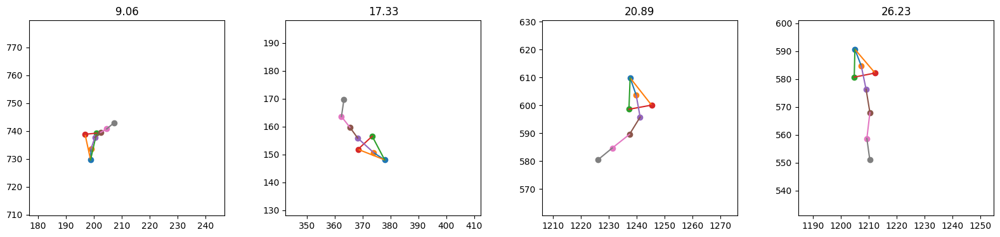

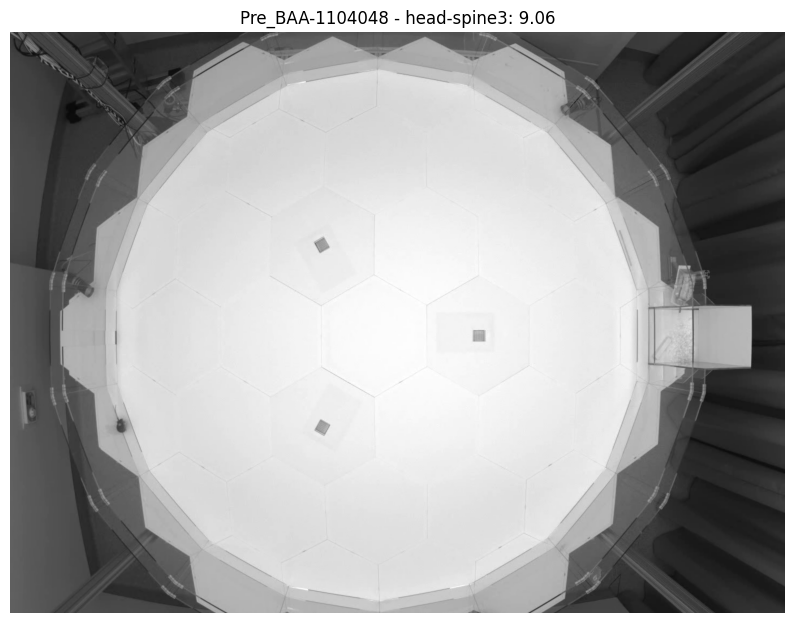

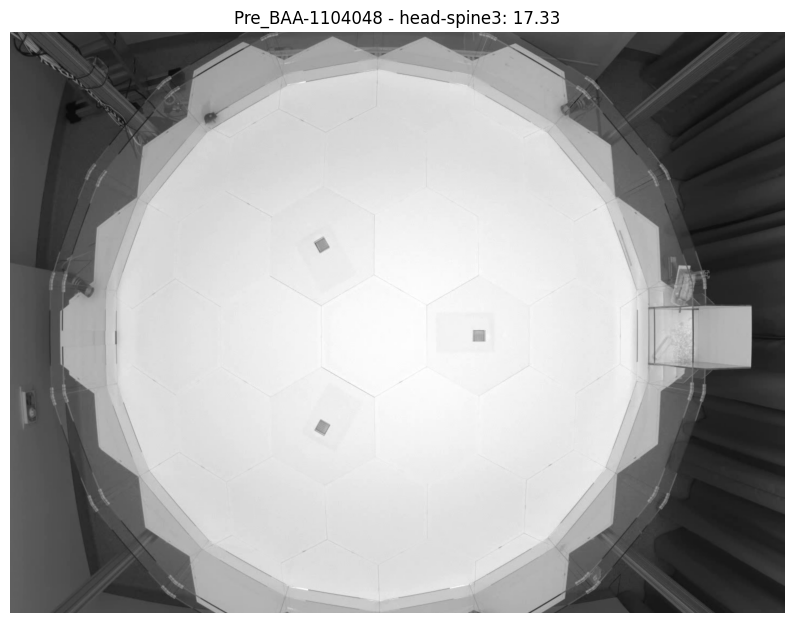

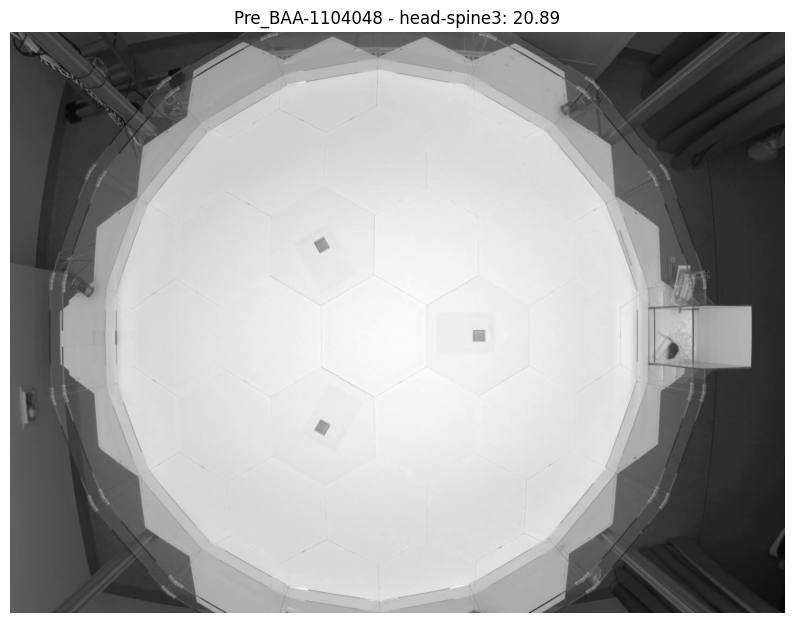

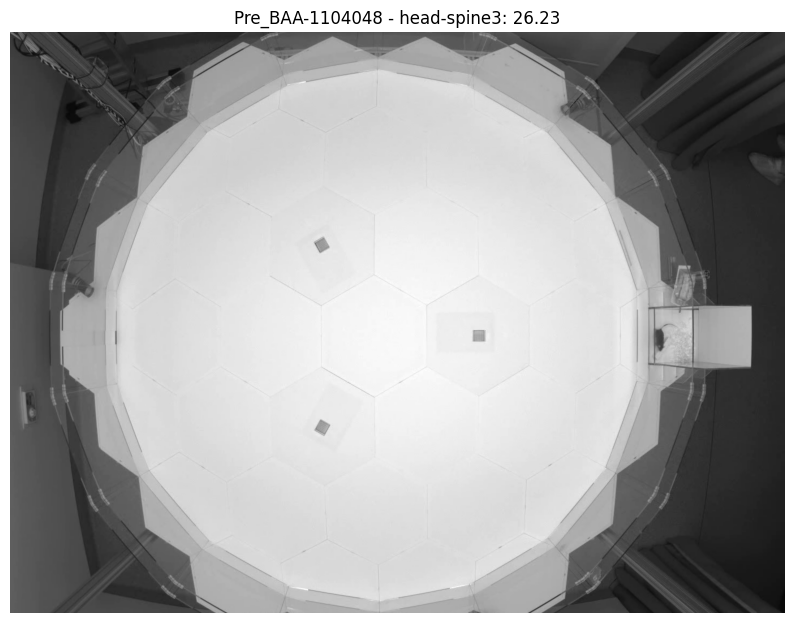

In [24]:
def Display_Body_Info(Mouse, property, nodes):
    def n_Cluster(variable):
        n_cluster = {
            'spine1-spine3': 3, 
            'head-spine3': 4, 
            'right_ear-spine3': 5,
            'left_ear-spine3': 5
        }
        return n_cluster[variable]
    
    def Get_Pose_Frame(variable, value_str, time):
        start, end = time + pd.Timedelta("0.1S"), time + pd.Timedelta("0.3S")
        root = Mouse.root
        video_metadata = aeon.load(root, social02.CameraTop.Video, start=start, end=end)
        video_metadata.index = video_metadata.index.round("20L")
        frames = video.frames(video_metadata)
        first_frame = next(frames)
        #cv2.imwrite("../Images/Social_BodyInfo/" + variable + '/frames/' + Mouse_title + '_' + value_str + '.jpg', first_frame)
        
        rgb_frame = cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 8))
        plt.imshow(rgb_frame)
        plt.title(f"{Mouse_title} - {variable}: {value_str}")
        plt.axis('off')  # Hide axes
        plt.show()

    def DrawBody(data_x, data_y, axs):
        for k in range(len(nodes_name)): 
            axs.scatter(data_x[nodes_name[k]], data_y[nodes_name[k]])
        axs.plot([data_x['nose'],data_x['head']], [data_y['nose'],data_y['head']])
        axs.plot([data_x['left_ear'],data_x['nose']], [data_y['left_ear'],data_y['nose']])
        axs.plot([data_x['nose'],data_x['right_ear']], [data_y['nose'],data_y['right_ear']])
        axs.plot([data_x['left_ear'],data_x['right_ear']], [data_y['left_ear'],data_y['right_ear']])
        axs.plot([data_x['head'],data_x['spine1']], [data_y['head'],data_y['spine1']])
        axs.plot([data_x['spine1'],data_x['spine2']], [data_y['spine1'],data_y['spine2']])
        axs.plot([data_x['spine2'],data_x['spine3']], [data_y['spine2'],data_y['spine3']])
        axs.plot([data_x['spine3'],data_x['spine4']], [data_y['spine3'],data_y['spine4']])
        x_min, y_min = min(np.array(data_x)), min(np.array(data_y))
        axs.set_aspect('equal', 'box')
        axs.set_xlim(x_min-20, x_min+50)
        axs.set_ylim(y_min-20, y_min+50)
        return axs

    def DrawPoses(variable, center, d, axs):
        for j in range(len(center)):
            for i in range(len(data_x)):
                if abs(d[i] - center[j]) < 0.1: 
                    if np.any(np.isnan(np.array(data_x.iloc[i]))): continue
                    axs[j] = DrawBody(data_x.iloc[i],data_y.iloc[i], axs[j])
                    axs[j].set_title(str(round(center[j],2)))
                    break
        for j in range(len(center)):
            for i in range(len(data_x)):
                if abs(d[i] - center[j]) < 0.1: 
                    if np.any(np.isnan(np.array(data_x.iloc[i]))): continue
                    Get_Pose_Frame(variable, str(round(center[j],2)), time = times[i])
                    break
        return axs

    def DrawDistance(variable):
        data = mouse_pos[variable].to_numpy()
        kmeans = KMeans(n_clusters=n_Cluster(variable), random_state=0, n_init = 'auto')
        clusters = kmeans.fit_predict(data.reshape(-1, 1))
        center = np.sort(kmeans.cluster_centers_.T[0])
        
        fig, axs = plt.subplots(1,len(center), figsize = (len(center)*5,4))
        axs = DrawPoses(variable,center, data, axs)
        #plt.savefig('../Images/Social_BodyInfo/'+ variable + '/' + Mouse_title + '.png')
        plt.show()

    Mouse_title = Mouse.type + '_' + Mouse.mouse
    times = Mouse.mouse_pos.index
    mouse_pos = Mouse.mouse_pos
    
    variable = nodes[0]
    for i in range(1, len(nodes)): variable = variable + '-' + nodes[i]
    
    data_x = Mouse.body_data_x
    data_y = Mouse.body_data_y
    
    DrawDistance(variable)

Display_Body_Info(Mouse, property = 'distance', nodes = ['head', 'spine3'])

# **2. Display Kinematic Properties**

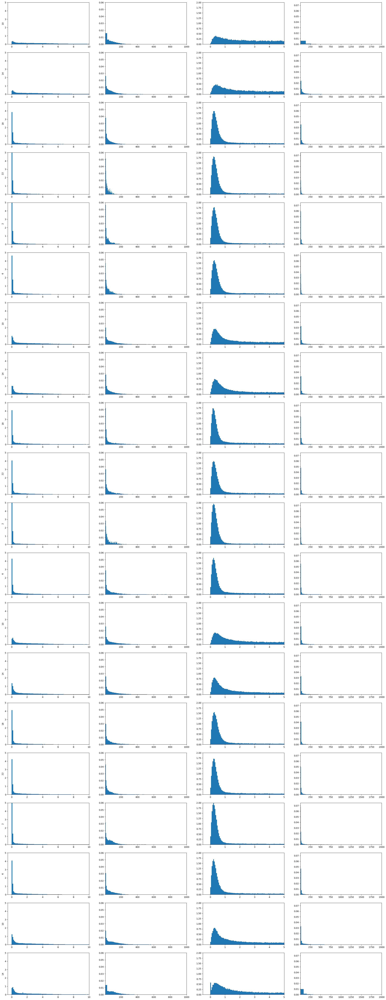

In [25]:
def Display_Kinematics_Distribution_Along_Time(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    start, end = mouse_pos.index[0], mouse_pos.index[-1]
    starts, ends = [],[]
    while start < end:
        end_ = start + pd.Timedelta('4H')

        starts.append(start)
        ends.append(end_)
        start = end_ + pd.Timedelta('1S')

    n = len(starts)
    fig, axs = plt.subplots(n, 4, figsize = (30, 4*n))
    for i in range(n):
        df = mouse_pos[starts[i]:ends[i]]
        speed = df.smoothed_speed
        axs[i,0].hist(speed[speed<10], density = True, bins = 100)
        axs[i,0].set_xlim((-0.5,10))
        axs[i,0].set_ylim((0,5))
        axs[i,1].hist(speed[speed>10], density = True, bins = 100)
        axs[i,1].set_xlim((9.5,1000))
        axs[i,1].set_ylim((0,0.06))
        
        acce = df.smoothed_acceleration
        axs[i,2].hist(acce[acce<5], density = True, bins = 100)
        axs[i,2].set_xlim((-0.5,5))
        axs[i,2].set_ylim((0,2))
        axs[i,3].hist(acce[acce>5], density = True, bins = 100)
        axs[i,3].set_xlim((4.5,2000))
        axs[i,3].set_ylim((0, 0.075))
        
        axs[i,0].set_ylabel(starts[i].hour)
    #plt.savefig(file_path + Mouse_title+'.png')
    plt.show()
    
Display_Kinematics_Distribution_Along_Time(Mouse)

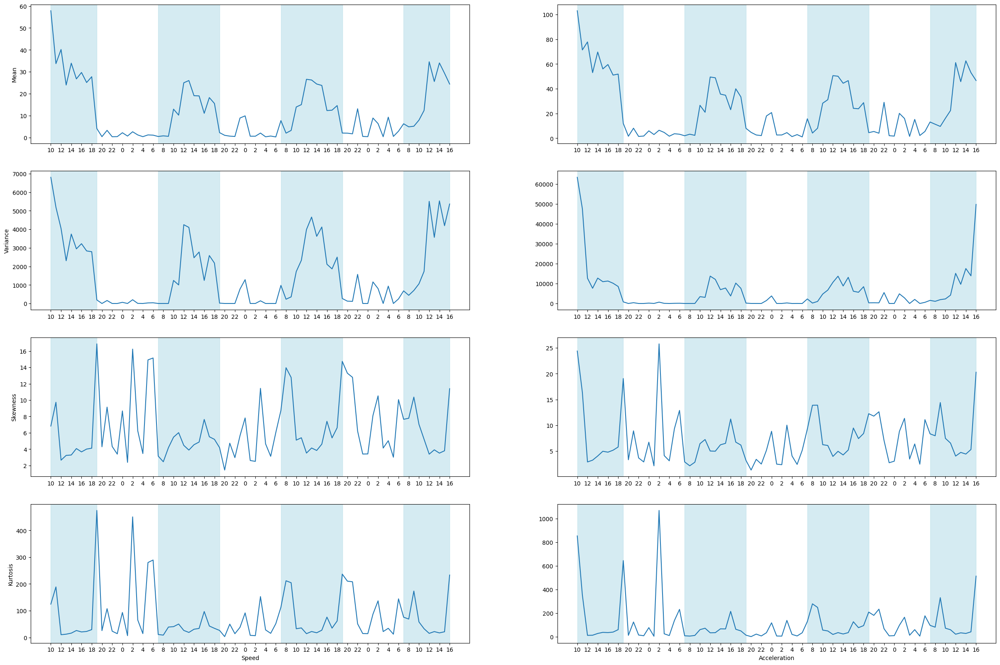

In [30]:
def Display_Kinematics_Properties_Along_Time(Mouse):   
    def Calculate_Properties(dist):
        mean = np.mean(dist)
        variance = np.var(dist)
        skewness = stats.skew(dist)
        kurtosis = stats.kurtosis(dist)
        return mean, variance, skewness, kurtosis

    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    start, end = mouse_pos.index[0], mouse_pos.index[-1]
    starts, ends = [],[]
    while start < end:
        if start.minute != 0:
            end_ = pd.Timestamp(year = start.year, month = start.month, day = start.day, hour = start.hour+1, minute=0, second=0)
        else: 
            end_ = start + pd.Timedelta('1H')

        starts.append(start)
        ends.append(end_)
        start = end_        
    
    Mean_V, Variance_V, Skewness_V, Kurtosis_V = [], [], [], []
    Mean_A, Variance_A, Skewness_A, Kurtosis_A = [], [], [], []
    Hour = []
    n = len(starts)
    
    CR = []
    for i in range(n):
        df = mouse_pos[starts[i]:ends[i]]
        speed = df.smoothed_speed
        mean, variance, skewness, kurtosis = Calculate_Properties(speed)
        Mean_V.append(mean)
        Variance_V.append(variance)
        Skewness_V.append(skewness)
        Kurtosis_V.append(kurtosis)
        
        acce = df.smoothed_acceleration
        mean, variance, skewness, kurtosis = Calculate_Properties(acce)
        Mean_A.append(mean)
        Variance_A.append(variance)
        Skewness_A.append(skewness)
        Kurtosis_A.append(kurtosis)
        
        Hour.append(starts[i].hour)
        if starts[i].hour == 7 or starts[i].hour == 19: CR.append(i)
    CR = np.array(CR)
    if starts[CR[0]].hour == 19: CR = np.concatenate((np.array([0]), CR))
    if starts[CR[-1]].hour == 7: CR = np.concatenate((CR, np.array([n-1])))
    
    N = np.arange(n)
    fis, axs = plt.subplots(4, 2, figsize = (30, 20))
    axs[0,0].plot(N, Mean_V)
    axs[0,0].set_ylabel('Mean')
    axs[1,0].plot(N, Variance_V)
    axs[1,0].set_ylabel('Variance')
    axs[2,0].plot(N, Skewness_V)
    axs[2,0].set_ylabel('Skewness')
    axs[3,0].plot(N, Kurtosis_V)
    axs[3,0].set_ylabel('Kurtosis')
    axs[0,1].plot(N, Mean_A)
    axs[1,1].plot(N, Variance_A)
    axs[2,1].plot(N, Skewness_A)
    axs[3,1].plot(N, Kurtosis_A)
    axs[3,0].set_xlabel('Speed')
    axs[3,1].set_xlabel('Acceleration')
    for i in range(4):
        for j in range(2):
            axs[i,j].set_xticks(N[::2], Hour[::2])
            for t in range(0,len(CR),2):
                axs[i,j].axvspan(CR[t],CR[t+1], color='lightblue', alpha=0.5)
    #plt.savefig(file_path + Mouse_title+'.png')
    #print('Display_Kinematics_Properties_Along_Time Completed')
    plt.show()

Display_Kinematics_Properties_Along_Time(Mouse)

# **3. Display HMM Results**

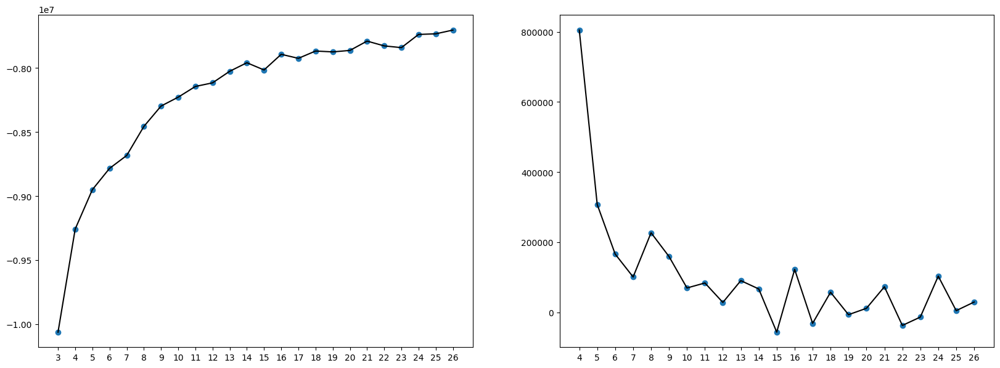

In [32]:
from IPython.display import Image, display

def Display_Model_Selection(Mouse, N, file_path):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    try:
        Loglikelihood = np.load('../SocialData/HMMStates/Loglikelihood_' + Mouse_title + '.npy', allow_pickle=True)
    except FileNotFoundError:
        Loglikelihood = []
        for n in N:
            Mouse.hmm.Fit_Model_without_Saving(n_state = n, feature = 'Kinematics_and_Body')
            Loglikelihood.append(Mouse.hmm.loglikelihood)
            print('End Inference for n = ', str(n))
        Loglikelihood = np.array(Loglikelihood)
        np.save('../SocialData/HMMStates/Loglikelihood_' + Mouse_title + '.npy', Loglikelihood)
    
    fig, axs = plt.subplots(1,2,figsize = (20,7))
    axs[0].scatter(N, Loglikelihood)
    axs[0].plot(N, Loglikelihood, color = 'black')
    axs[0].set_xticks(N)
    
    df = Loglikelihood[1:] - Loglikelihood[:-1]
    axs[1].scatter(N[1:], df)
    axs[1].plot(N[1:], df, color = 'black')
    axs[1].set_xticks(N[1:])
    plt.savefig(file_path + Mouse_title + '.png')
    plt.show()

Display_Model_Selection(Mouse, N = np.arange(3, 27), file_path = '../Images/Social_HMM/StateNumber/')
#display(Image(filename='../Images/Social_HMM/StateNumber/' + Mouse.type + '_' + Mouse.mouse + '.png'))

In [11]:
Mouse.hmm.n_state = 10
Mouse.hmm.feature = 'Kinematics_and_Body'
#Mouse.hmm.Fit_Model(n_state = 10, feature = 'Kinematics_and_Body')
Mouse.hmm.Get_TransM(n_state = 10, feature = 'Kinematics_and_Body')
Mouse.hmm.Get_States(n_state = 10, feature = 'Kinematics_and_Body')

print(Mouse.hmm.features)
print(Mouse.hmm.parameters)

['smoothed_speed', 'smoothed_acceleration', 'spine1-spine3', 'head-spine3', 'right_ear-spine3', 'left_ear-spine3']
None


## ***I. Transition Matrix***

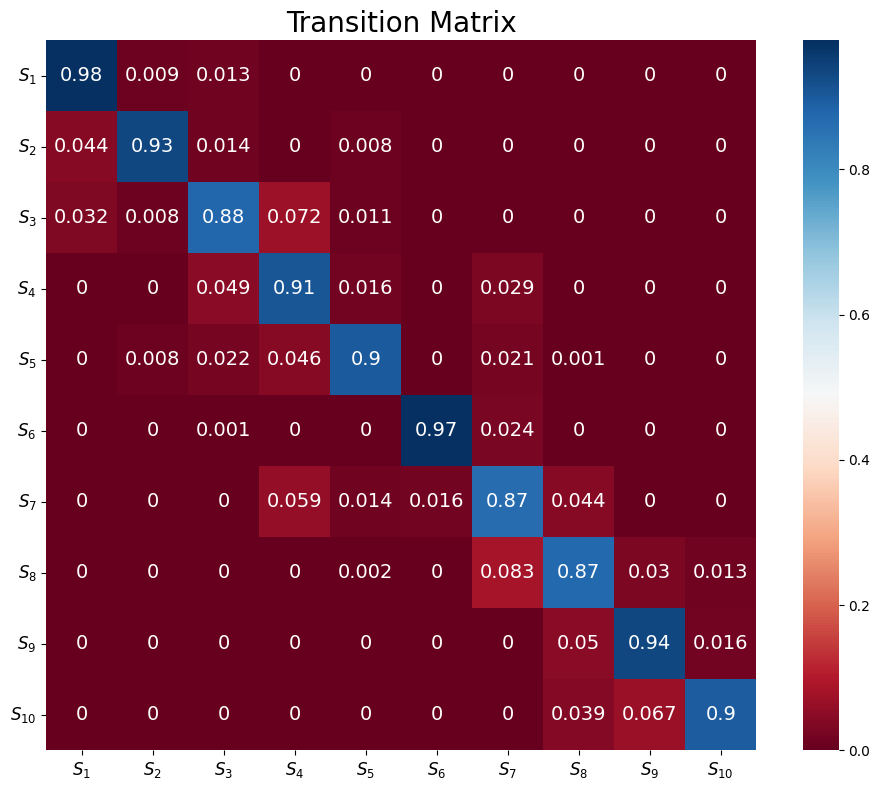

In [12]:
def Display_HMM_TransM(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    TransM = Mouse.hmm.TransM
    annot_array = np.array([[round(item, 3) for item in row] for row in TransM])
    labels = ['$S_{' + str(i+1) + '}$' for i in range(len(TransM))]
    
    fig, axs = plt.subplots(1,1, figsize=(10,8))
    sns.heatmap(TransM, cmap='RdBu', ax = axs, square = 'True', cbar = True, annot=annot_array, annot_kws={'size': 14})
    axs.set_title("Transition Matrix", fontsize = 20)
    axs.set_xticklabels(labels)
    axs.set_yticklabels(labels, rotation = 0)
    axs.tick_params(axis='both', which='major', labelsize=12)
    plt.tight_layout()
    plt.show()

Display_HMM_TransM(Mouse)

## ***II. States (in One Day)***

In [ ]:
def Display_HMM_States_Along_Time(Mouse):
    Mouse_title = Mouse.type + '_' + Mouse.mouse
    mouse_pos = Mouse.mouse_pos
    N = Mouse.hmm.n_state
    states = Mouse.hmm.states
    start, end = Mouse.active_chunk[0], Mouse.active_chunk[1]
    
    mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)
    mouse_pos = mouse_pos[start:end]
    
    states_prob = Mouse.hmm.process_states.State_Dominance(mouse_pos, time_seconds = 10)
    states_prob['CR'] = 0
    CR_index_1 = states_prob[states_prob.index.hour < 7].index
    CR_index_2 = states_prob[states_prob.index.hour > 19].index
    CR_index = CR_index_1.union(CR_index_2).sort_values()
    states_prob.loc[CR_index, 'CR'] = 1
    groups = states_prob['CR'].ne(states_prob['CR'].shift()).cumsum()
    zero_groups = states_prob[states_prob['CR'] == 0].groupby(groups).groups
    zero_groups = list(zero_groups.values())

    START, END = [],[]
    for i in range(len(zero_groups)):
        START.append(zero_groups[i][0])
        END.append(zero_groups[i][-1])

    N = max(states) + 1
    fig, axs = plt.subplots(N, 1, figsize=(50, 4*N-1))
    for i in range(N):
        states_prob[i].plot(color = color_names[i], ax = axs[i])
        for t in range(len(START)):
            axs[i].axvspan(START[t],END[t], color='lightblue', alpha=0.5)
    plt.show()

Display_HMM_States_Along_Time(Mouse) 

## ***III. Features of Each State***

In [35]:
def CollectData_Single(mouse_pos):
    x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3 = [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)], [np.array([]) for _ in range(N)]
    for i in range(N):
        x[i] =  mouse_pos['smoothed_position_x'][states==i]
        y[i] = mouse_pos['smoothed_position_y'][states==i]
        speed[i] = mouse_pos['smoothed_speed'][states==i]
        acce[i] = mouse_pos['smoothed_acceleration'][states == i]
        r[i] = mouse_pos['r'][states == i]
        spine1_spine3[i] = mouse_pos['spine1-spine3'][states == i]
        head_spine3[i] = mouse_pos['head-spine3'][states == i]
        right_ear_spine3[i] = mouse_pos['right_ear-spine3'][states == i]
        left_ear_spine3[i] = mouse_pos['left_ear-spine3'][states == i]
    return x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3

Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
states = Mouse.hmm.states
N = Mouse.hmm.n_state
mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

x, y, speed, acce, r, spine1_spine3, head_spine3, right_ear_spine3, left_ear_spine3 = CollectData_Single(mouse_pos)

### ***I. Positions***

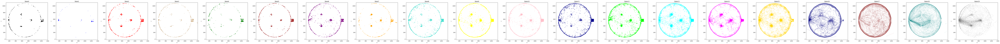

In [36]:
def PlotPosition(x, y):
    fig, axs = plt.subplots(1, N, figsize = (N*8-2,6))
    for i in range(N):
        axs[i].scatter(x[i], y[i], color = color_names[i], s = 2, alpha = 0.2)
        axs[i].set_xlim((100,1400))
        axs[i].set_ylim((-20,1100))
        axs[i].set_title('State' + str(i))
        axs[i].set_xlabel('X')
        axs[i].set_ylabel('Y')
    plt.show()

PlotPosition(x, y)

### ***II. Parameter Features***

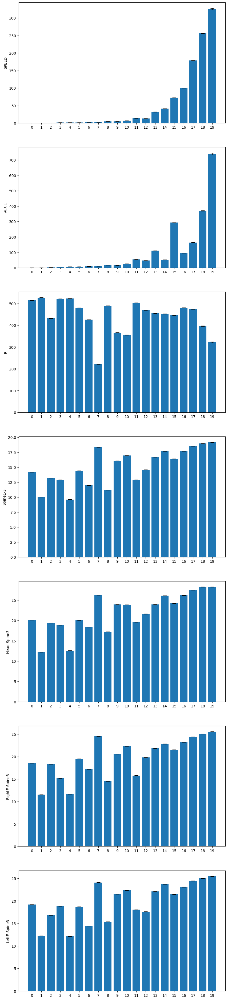

In [37]:
def PlotFeatures(DATA, FEATURE):
    fig, axs = plt.subplots(len(DATA), 1, figsize = (10, len(DATA)*7-1))
    for data, i in zip(DATA, range(len(DATA))):
        means = [np.mean(arr) for arr in data]
        #var = [np.std(arr)/np.sqrt(len(arr)) for arr in data]
        var = [np.std(arr) for arr in data]
        axs[i].bar(range(N), means, yerr=var, capsize=10)
        axs[i].set_xticks(range(0, N), [str(j+1) for j in range(N)])
        axs[i].set_ylabel(FEATURE[i], fontsize = 35)
        axs[i].spines['top'].set_visible(False)
        axs[i].spines['right'].set_visible(False)
        axs[i].tick_params(axis='both', which='major', labelsize=30)
    axs[len(DATA)-1].set_xlabel('State', fontsize = 40)
    plt.tight_layout()
    plt.sshow()
    
PlotFeatures(DATA = [speed, acce, r, head_spine3], FEATURE = ['SPEED', 'ACCE', 'R', 'Head-Spine3'])

## ***III. Characterisation of Events***

In [93]:
def Characterize_Timepoints(event_name, Events, left_seconds, right_seconds, file_name):
    file_path = '../Images/Social_HMM/'
    
    STATES = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'state')
    X = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'smoothed_position_x')
    Y = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds, right_seconds, 'smoothed_position_y')
    
    fig, axs = plt.subplots(1, 1, figsize=(10, 16))
    sns.heatmap(STATES,cmap=cmap, ax=axs, vmin=0, vmax = N-1, cbar = True)
    axs.set_aspect('auto')
    axs.set_xticks([10*left_seconds])
    axs.set_xticklabels([event_name], rotation = 0)
    axs.set_ylabel("Events")
    axs.set_yticks([])
    plt.savefig(file_path + file_name + '/' + Mouse_title + '.png')
    
    fig, axs = plt.subplots(1, 1, figsize=(20, 20))
    mask = ~np.isnan(STATES[0])
    
    for i in range(len(STATES)):
        colors = np.array(color_names)[STATES[i][mask].astype(int)]
        x = X[i][mask]
        y = Y[i][mask]
        dx = np.diff(x)
        dy = np.diff(y)
        axs.quiver(x[:-1], y[:-1], dx, dy, color=colors[:-1], 
                angles='xy', scale_units='xy', scale=1.1, 
                width=0.001, headwidth=3, headlength=3)
    axs.set_aspect('equal')
    axs.set_xlim((100,1400))
    axs.set_ylim((-20,1100))
    plt.savefig(file_path + file_name + '/' + Mouse_title + '_Position.png')
    
    if event_name != 'Enter Arena':
        fig, axs = plt.subplots(1, 3, figsize=(30, 10))
        for i in range(len(STATES)):
            colors = np.array(color_names)[STATES[i][mask].astype(int)]
            x = X[i][mask]
            y = Y[i][mask]
            dx = np.diff(x)
            dy = np.diff(y)
            for j in range(len(Mouse.arena.patch)):
                axs[j].quiver(x[:-1], y[:-1], dx, dy, color=colors[:-1], 
                    angles='xy', scale_units='xy', scale=1.1, 
                    width=0.001, headwidth=4, headlength=4)
        
        patch_r = Mouse.arena.patch_r
        for i in range(len(Mouse.arena.patch)):
            patch = Mouse.arena.patch[i]
            axs[i].set_aspect('equal')
            patch_ox, patch_oy = Mouse.arena.patch_location[patch][0], Mouse.arena.patch_location[patch][1]
            x_min, x_max, y_min, y_max = patch_ox-patch_r, patch_ox+patch_r, patch_oy-patch_r, patch_oy+patch_r
            axs[i].set_xlim(x_min, x_max)
            axs[i].set_ylim(y_min, y_max)
            axs[i].set_title(patch)

        plt.tight_layout()
        plt.savefig(file_path + file_name + '/' + Mouse_title + '_Position_EachPatch.png')

    AVE_STATES = []
    for k in np.arange(N):
        index = STATES == k
        states = index*1
        AVE_STATES.append(np.mean(states, axis = 0))
    AVE_STATES = np.array(AVE_STATES)
    fig, axs = plt.subplots(1, 1, figsize=(10, 10))
    for i in range(AVE_STATES.shape[0]):
        color = color_names[i]
        rgba_color = plt.cm.colors.to_rgba(color)
        for j in range(AVE_STATES.shape[1]):
            if np.isnan(AVE_STATES[i, j]):
                axs.add_patch(plt.Rectangle((j, N-1-i), 0.2, 1, color=plt.cm.colors.to_rgba('black'), alpha=1, linewidth=0))
            else:
                axs.add_patch(plt.Rectangle((j, N-1-i), 1, 1, color=rgba_color, alpha=AVE_STATES[i, j], linewidth=0))
    axs.set_aspect('auto')
    axs.set_xticks([10*left_seconds])
    axs.set_xticklabels([event_name], rotation = 0)
    axs.set_ylabel("States")
    axs.set_yticks(np.arange(N) + 0.5)
    axs.set_yticklabels(np.arange(N-1,-1,-1))
    axs.set_xlim(0, AVE_STATES.shape[1])
    axs.set_ylim(0, AVE_STATES.shape[0])
    plt.savefig(file_path + file_name + '_EachState/' + Mouse_title + '.png')

Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
states = Mouse.hmm.states
N = Mouse.hmm.n_state

Pellets = Mouse.arena.pellets.index
Visits = Mouse.arena.visits.dropna(subset=['speed'])
Starts = Visits['start']
Ends = Visits['end']
Entry = Mouse.arena.entry 

mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

colors = sns.xkcd_palette(color_names[0:N])
cmap = gradient_cmap(colors)

### ***i. Enter Arena***

In [ ]:
Characterize_Timepoints('Enter Arena', Entry, left_seconds = 5, right_seconds = 5, file_name = 'EnterArena')

### ***ii. Enter Patch***

In [ ]:
Characterize_Timepoints('Move Wheel', Starts, left_seconds = 5, right_seconds = 3, file_name = 'EnterVisit')

### ***iii. Leave Patch***

In [111]:
STATES = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'state')
X = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'smoothed_position_x')
Y = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'smoothed_position_y')

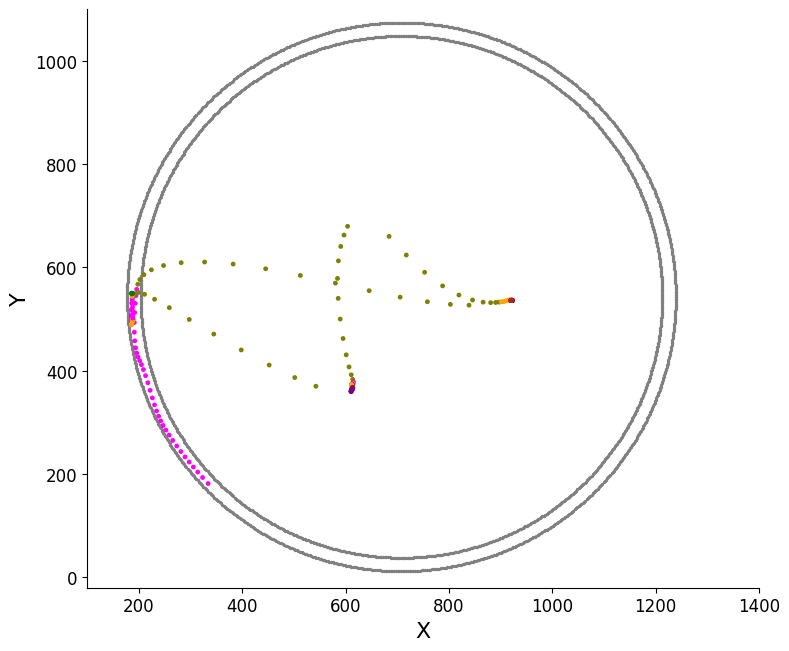

In [ ]:
STATES = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'state')
X = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'smoothed_position_x')
Y = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Ends, 3, 5, 'smoothed_position_y')

idx = np.array([17, 113, 49, 58]) # patch3 for 58, patch 1 for 49
STATES_ = STATES[idx,int((3*10) + 2):]
X_ = X[idx,int((3*10) + 2):]
Y_ = Y[idx,int((3*10) + 2):]

origin = Mouse.arena.origin 
radius = int(Mouse.arena.metadata.ActiveRegion.ArenaInnerRadius)
angles = np.linspace(0, 2 * np.pi, 1000)

x = origin[0] + radius * np.cos(angles)
y = origin[1] + radius * np.sin(angles)

fig, axs = plt.subplots(1, 1, figsize=(8,8))
axs.scatter(x, y, color='grey', s=2)  

radius = int(Mouse.arena.metadata.ActiveRegion.ArenaOuterRadius)
x = origin[0] + radius * np.cos(angles)
y = origin[1] + radius * np.sin(angles)

axs.scatter(x, y, color='grey', s=2)  

for i in range(len(STATES_)):
    colors = np.array(color_names)[STATES_[i].astype(int)]
    x = X_[i]
    y = Y_[i]
    axs.scatter(x, y, color = colors, s=6)
axs.set_xlabel('X', fontsize = 16)
axs.set_ylabel('Y', fontsize = 16)
axs.tick_params(axis='both', which='major', labelsize=12)
axs.spines['top'].set_visible(False)
axs.spines['right'].set_visible(False)
axs.set_aspect('equal')
axs.set_xlim((100,1400))
axs.set_ylim((-20,1100))
plt.tight_layout()
plt.show()

In [ ]:
Characterize_Timepoints('Leave Wheel', Ends, left_seconds = 3, right_seconds = 5, file_name = 'EndVisit')

### ***iv. Pellet Deliveries***

In [ ]:
Characterize_Timepoints('Pellet Delivery', Pellets, left_seconds = 3, right_seconds = 5, file_name = 'PelletDelivery')

## ***IV. Prediction of Events***

In [8]:
def Calculate_Probability_Curve(characterized_states_curve = [], time_shifts = [], means = [], variances = []):
    T = len(characterized_states_curve[0])
    P = np.ones(T)
    p_ = []
    
    for i in range(len(characterized_states_curve)):
        p = np.zeros(T)
        characterized_state, time_shift, mean, variance = characterized_states_curve[i], time_shifts[i], means[i], variances[i]
        if time_shift < 0:
            p[-time_shift:] = np.exp(-((characterized_state[:time_shift] - mean) ** 2) / (2 * variance ** 2))
        else:
            p[:-time_shift] = np.exp(-((characterized_state[time_shift:] - mean) ** 2) / (2 * variance ** 2))
        p_.append(p)

    for p in p_: P *= p
    return P

def Summarize(event_name, Events):
    mouse_pos_ = mouse_pos.copy()[Active_Chunk[0]:Active_Chunk[1]]
    Events = Events[Events > Active_Chunk[0]]
    Events = Events[Events < Active_Chunk[1]]

    COUNT_CURVES = [[] for _ in range(N)]
    COUNT_CURVES_MAX = []
    for i in range(N):
        count_curves = Mouse.hmm.process_states.Event_Triggering(mouse_pos_, Events, left_seconds = 5, right_seconds = 5, variable = 'State' + str(i), insert_nan = 0)
        COUNT_CURVES[i] = np.mean(np.array(count_curves), axis = 0)
        COUNT_CURVES_MAX.append(np.max(COUNT_CURVES[i]))

    Peaks_index = np.argsort(COUNT_CURVES_MAX)
    if COUNT_CURVES_MAX[Peaks_index[-4]] > 0.4: threshold = COUNT_CURVES_MAX[Peaks_index[-4]]
    elif COUNT_CURVES_MAX[Peaks_index[-3]] < 0.4: threshold = COUNT_CURVES_MAX[Peaks_index[-3]]
    else: threshold = 0.4
    
    characterized_states, characterized_states_peak, characterized_states_names, time_shifts = [], [], [], []
    for i in range(N):
        if np.max(COUNT_CURVES[i]) > threshold:
            characterized_states.append(i)
            characterized_states_peak.append(np.max(COUNT_CURVES[i]))
            characterized_states_names.append('State'+str(i))
            max_index = np.argsort(COUNT_CURVES[i], -1)[-1]
            time_shifts.append(max_index - 50 + 3)
    return characterized_states, characterized_states_peak, characterized_states_names, time_shifts
    
def Predict(event_name, Events, file_name):
    characterized_states, characterized_states_peak, characterized_states_names, time_shifts = Summarize(event_name, Events)
    means = [1, 1,1,1,1,1, 1, 1,1,1,1,1]
    variances = [0.1, 0.1, 0.1,0.1,0.1, 0.1, 0.1, 0.1, 0.1,0.1,0.1, 0.1]
    
    if len(characterized_states) == 0:
        return 'No states characterized'

    characterized_states_curve = []
    for i in range(len(characterized_states)):
        characterized_states_curve.append(mouse_pos.loc[mouse_pos.index, characterized_states_names[i]].to_numpy())
    probability_curve = Calculate_Probability_Curve(characterized_states_curve, time_shifts = time_shifts, means = characterized_states_peak, variances = variances)
    mouse_pos.loc[mouse_pos.index, 'prob'] = probability_curve

    COUNT_CURVES = [[] for _ in range(len(characterized_states_curve))]
    Events = Events[Events > Predicting_Chunk_start]
    PROB = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds = 5, right_seconds = 5, variable = 'prob', insert_nan = 0)
    for i in range(len(characterized_states_curve)):
        COUNT_CURVES[i] = Mouse.hmm.process_states.Event_Triggering(mouse_pos, Events, left_seconds = 5, right_seconds = 5, variable = characterized_states_names[i], insert_nan = 0)
    
    fig, axs = plt.subplots(1, 1, figsize=(10, 6))
    T = np.arange(-50, 50, 1)
    for i in range(len(characterized_states_curve)):
        axs.plot(T, np.mean(np.array(COUNT_CURVES[i]), axis = 0), label = characterized_states_names[i], color = color_names[int(characterized_states_names[i][-1])], linestyle = '--')
    axs.axvline(x = 0, color = 'red')
    axs.legend(loc = 'upper right')
    axs_ = axs.twinx()
    axs_.plot(T, np.mean(np.array(PROB), axis = 0), color = 'black', label = 'Pred.')
    axs_.legend(loc = 'lower right')
    plt.show()
    #plt.savefig('../Images/Social_HMM/' + file_name + '/' + Mouse_title + '_Prediction.png')
    
    return 'Predicton for ' + file_name + ' Completed'
    
Mouse_title = Mouse.type + '_' + Mouse.mouse
mouse_pos = Mouse.mouse_pos
N = Mouse.hmm.n_state
states = Mouse.hmm.states
mouse_pos['state'] = pd.Series(states, index = mouse_pos.index)

Pellets = Mouse.arena.pellets.index
Visits = Mouse.arena.visits
Entry = Mouse.arena.entry 
Starts = Visits['start'].to_numpy()
Ends = Visits['end'].to_numpy()

Active_Chunk = Mouse.active_chunk
Predicting_Chunk_start = Active_Chunk[1] + pd.Timedelta('1S')

mouse_pos = Mouse.hmm.process_states.State_Timewindow(mouse_pos, timewindow = 10)

In [9]:
mouse_pos.head()

,x,y,smoothed_position_x,smoothed_position_y,smoothed_speed,smoothed_acceleration,r,head-spine3,spine1-spine3,left_ear-spine3,...,State10,State11,State12,State13,State14,State15,State16,State17,State18,State19
2024-01-31 10:21:35.080,1211.280273,536.604614,1208.792563,535.186117,4.551833,44.713777,529.632365,22.337027,14.260906,18.927624,...,0.0,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-01-31 10:21:35.180,1211.282593,536.633789,1209.317782,535.544937,8.171147,36.236906,530.136694,21.848267,14.021329,18.166112,...,0.0,0.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-01-31 10:21:35.280,1211.249390,538.595581,1210.050673,535.997872,9.069689,10.685626,530.843517,22.372799,14.188038,18.682816,...,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-01-31 10:21:35.380,1211.348389,536.458435,1210.793780,536.364330,7.541719,19.167204,531.565648,21.733369,14.667550,19.066132,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-01-31 10:21:35.480,1213.197021,536.199951,1211.393213,536.513614,4.992760,33.118302,532.156200,21.732644,14.384207,18.652252,...,0.0,0.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
Events = Entry
file_name = 'EnterArena'

mouse_pos[file_name] = 0
nearest_indices = mouse_pos.index.get_indexer(Events, method='nearest')
mouse_pos.iloc[nearest_indices, mouse_pos.columns.get_loc(file_name)] = 1

window_size = 100
mouse_pos['intensity'] = mouse_pos[file_name].rolling(window=window_size, min_periods=1).sum()

regression = mouse.Regression(mouse_pos[Active_Chunk[0]:Active_Chunk[1]])
regression.predictor = 'intensity'
regression.regressor = []
for i in range(N): regression.regressor.append('State' + str(i))

obs, pred, result = regression.Linear_Regression()

prediction = mouse.Regression(mouse_pos[Predicting_Chunk_start:])
prediction.predictor = 'intensity'
prediction.regressor = regression.regressor 
prediction.Get_Variables()

y_pred = result.predict(prediction.X)

/nfs/nhome/live/zimol/ProjectAeon/Code/Functions/mouse.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.X['interc'] = 1


In [ ]:
fig, axs = plt.subplots(2, 1, figsize=(50, 4))
mouse_pos_ = mouse_pos[Predicting_Chunk_start:]
mouse_pos_['intensity_pred'] = y_pred.to_numpy()
mouse_pos_.intensity.plot(ax = axs[0], color = 'red')
mouse_pos_.intensity_pred.plot(ax = axs[0], color = 'black')
for i in range(len(Events)):
    trigger = Events[i]
    axs[1].axvline(x = trigger, color = 'red')

plt.savefig('../Images/Social_HMM/' + file_name + '/' + Mouse_title + '_Prediction_Poisson.png')

### ***i. Enter Arena***

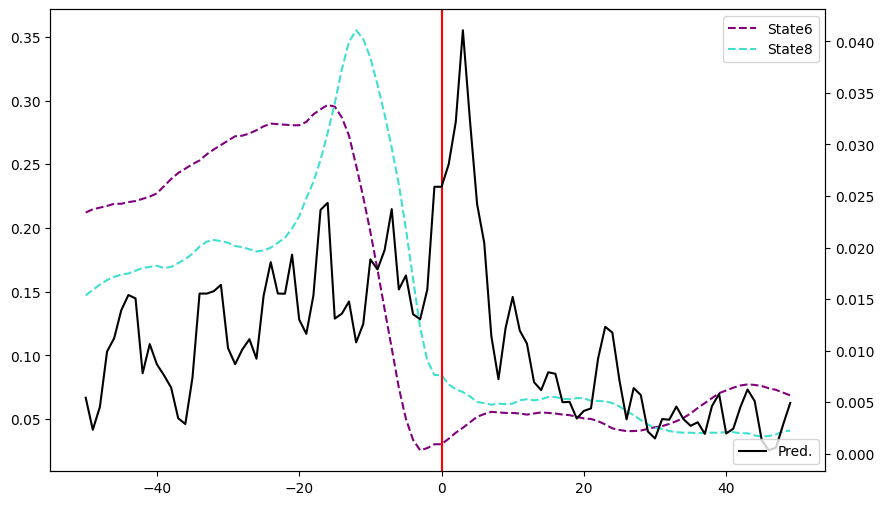

In [7]:
result = Predict(event_name = 'Enter Arena', Events = Entry, file_name = 'EnterArena')

### ***ii. Enter Patch***

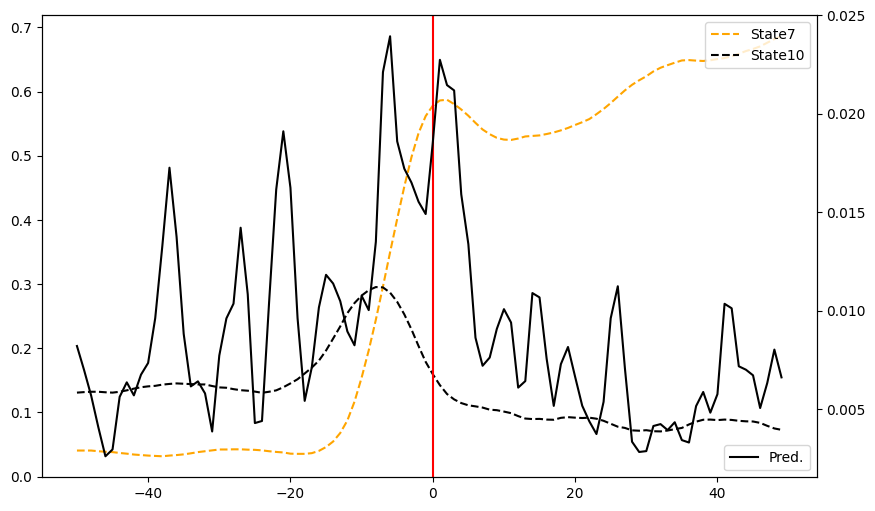

In [8]:
result = Predict(event_name = 'Move Wheel', Events = Starts, file_name = 'EnterVisit')

### ***iii. Leave Patch***

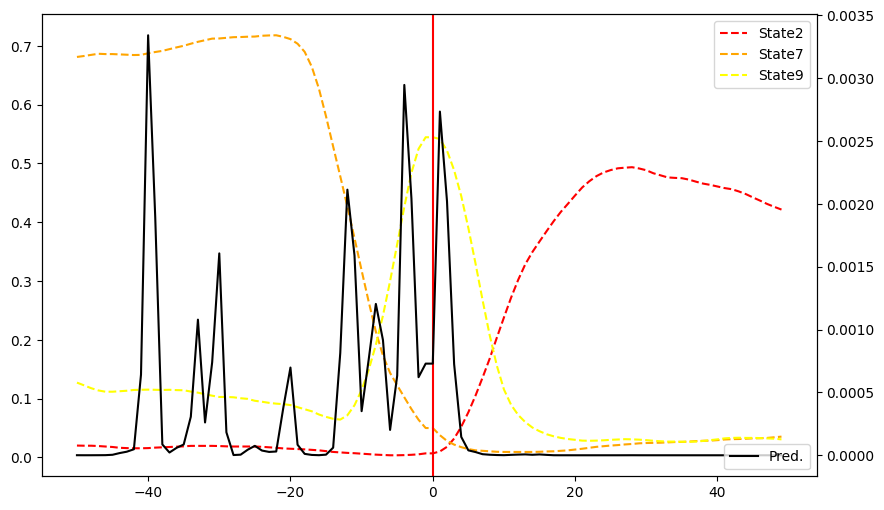

In [9]:
result = Predict(event_name = 'Leave Wheel', Events = Ends, file_name = 'EndVisit')

### ***iv. Pellet Delivery***

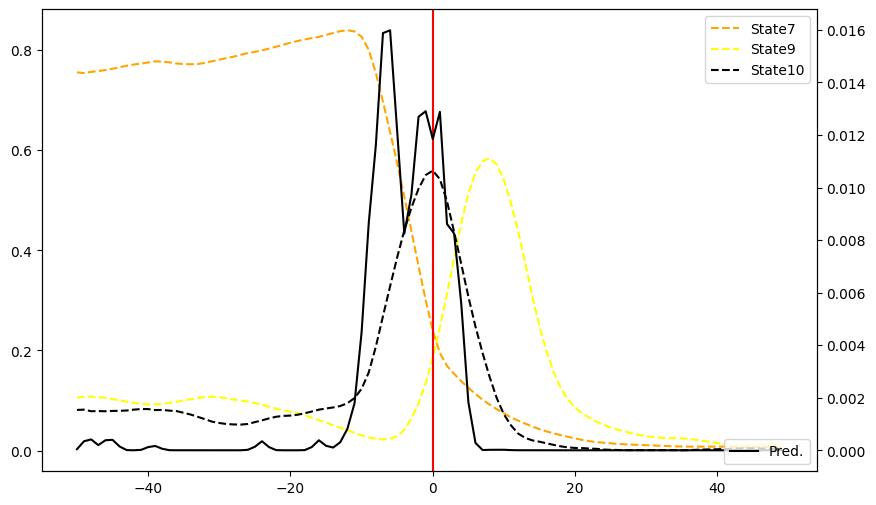

In [10]:
result = Predict(event_name = 'Pellet Delivery', Events = Pellets, file_name = 'PelletDelivery')

# **4. Display Regression Results of visit Duration**

In [11]:
def Display_Visit_Prediction(VISITS, model, file_path, title):
    regression = mouse.Regression(VISITS)
    regression.regressor = ['speed', 'acceleration', 'last_pellets_self', 'last_pellets_other','last_duration', 'last_interval','last_pellets_interval', 'entry']
    
    if model == 'linear': 
        obs, pred, result = regression.Linear_Regression()
        '''fig, axs = plt.subplots(figsize=(20, 8))
        axs.axis('off')
        axs.text(0.5, 0.5, str(result.summary()),
                    verticalalignment='center', horizontalalignment='left',
                    transform=axs.transAxes, fontsize=12)'''
        print(result.summary())
    if model == 'MLP': 
        obs, pred = regression.Multilayer_Perceptron()
    
    fig, axs = plt.subplots(1, 1, figsize=(5, 5))
    axs.scatter(obs, pred, s = 10)    
    axs.set_xlabel('Observation', fontsize = 24)
    axs.set_ylabel('Prediction', fontsize = 24)
    axs.spines['top'].set_visible(False)
    axs.spines['right'].set_visible(False)
    #axs.legend(fontsize = 20)
    #axs.set_ylim((-max(obs)-1, max(obs)+1))
    plt.tight_layout()
    #plt.savefig(file_path + title)
    plt.show()

## ***I. Linear Regression***

/nfs/nhome/live/zimol/ProjectAeon/SURF/Functions/mouse.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.X['interc'] = 1


                 Generalized Linear Model Regression Results                  
Dep. Variable:               duration   No. Observations:                  298
Model:                            GLM   Df Residuals:                      289
Model Family:                Gaussian   Df Model:                            8
Link Function:               Identity   Scale:                          1980.3
Method:                          IRLS   Log-Likelihood:                -1549.3
Date:                Tue, 25 Jun 2024   Deviance:                   5.7231e+05
Time:                        19:33:50   Pearson chi2:                 5.72e+05
No. Iterations:                     3   Pseudo R-squ. (CS):            0.03921
Covariance Type:            nonrobust                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
speed                     0.33

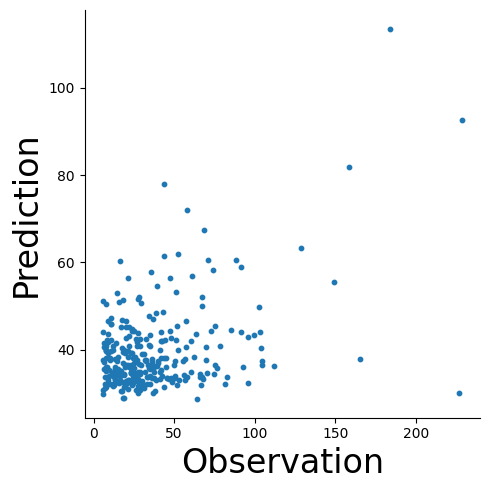

In [12]:
Display_Visit_Prediction(Mouse.arena.visits, model = 'linear', file_path = '../Images/Social_Regression/'+Mouse.type+'-'+Mouse.mouse+'/', title = 'Linear_Regression.png')                                            

## ***II. Multi-Layer Perceptron***

/nfs/nhome/live/zimol/ProjectAeon/SURF/Functions/mouse.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.X['interc'] = 1
2024-06-25 19:34:04.532960: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2024-06-25 19:34:04.533011: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (sgw2): /proc/driver/nvidia/version does not exist


Epoch 1/100
10/10 [==============================] - 1s 3ms/step - loss: 4710.4487 - mae: 48.5727
Epoch 2/100
10/10 [==============================] - 0s 2ms/step - loss: 4710.3486 - mae: 48.5699
Epoch 3/100
10/10 [==============================] - 0s 2ms/step - loss: 4698.4106 - mae: 48.4958
Epoch 4/100
10/10 [==============================] - 0s 2ms/step - loss: 11286.1104 - mae: 50.9436
Epoch 5/100
10/10 [==============================] - 0s 2ms/step - loss: 4330.8960 - mae: 44.4146
Epoch 6/100
10/10 [==============================] - 0s 2ms/step - loss: 3642.6057 - mae: 38.6637
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 3172.3450 - mae: 36.2754
Epoch 8/100
10/10 [==============================] - 0s 2ms/step - loss: 13275.1758 - mae: 41.7437
Epoch 9/100
10/10 [==============================] - 0s 2ms/step - loss: 3193.1716 - mae: 35.5044
Epoch 10/100
10/10 [==============================] - 0s 2ms/step - loss: 3443.3511 - mae: 36.4294
Epoch 11/100
10/1

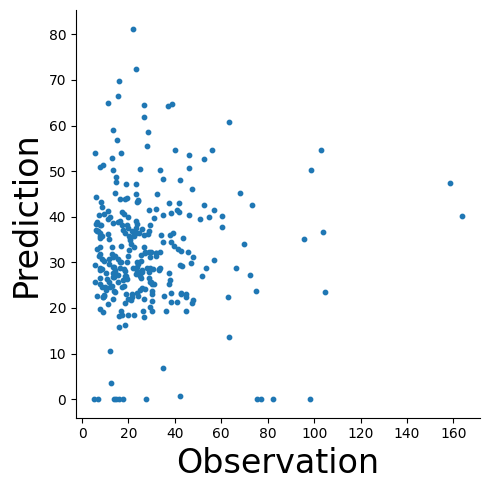

In [13]:
Display_Visit_Prediction(Mouse.arena.visits, model = 'MLP', file_path = '../Images/Social_Regression/'+Mouse.type+'-'+Mouse.mouse+'/', title = 'MLP.png')